# HW 3 Optimization (80pts)

**Due 11:59pm, Apr 29th.**

## Please restart the kernel and run all before you submit !


## Your Name: 

In [1]:
# import packages
import numpy as np
import matplotlib.pyplot as plt
import time as time
import matplotlib.animation as FuncAnimation
from IPython.display import HTML


# Exercise 1: SGD with arbitrary batch size  (50pts)

**The goal of this exercise is to implement SGD with arbitrary batch size for a certain linear regression model.** 

Given data points $(x^i,y^i)_{i=1}^m$ where each data point $x$ has three features/attributes, i.e. $x=(x_1,x_2,x_3)$, we consider the following linear regression model
$$ y =  a_0 + a_1x_1 + a_2x_2 + a_3x_3.$$

Here, $a_0,a_1,a_2,a_3$ are coefficients. 

The corresponding optimization problem is 

$$ \mathop{\mathrm{Loss}}(a_0,a_1,a_2,a_3) = \frac{1}{m}\sum_{i=1}^{m} (a_0+a_1x_1^i+a_2x_2^i+a_3x_3^i-y^i)^2 $$


You should do the following three things:

1. Write a python function to implement SGD with arbitrary batch_size. Hint: you can write it as a python function and treat batch size as a function input.

2. Select at least 4 batch sizes and fix the number of iteration, then run SGD for different batch sizes, report the the running time for each batch size (use `print`). What is your conclusion?

3. For each batch size you used in part 2, draw a plot to visualize the loss (y-axis) vs iterations (x-axis). What is your conclusion?

Requirements:

1. Your SGD algorithm should allow different batch sizes. 

2. Write python functions or for loop to do 2 and 3.

3. Detailed docustring is required for each function. Add necessary inline comments and markdown to explain your code and make comments.

Grading is based on the codes (15 pts), function docstrings (10 pts), comments (10 pts) and conclusions (15 pts).

In [2]:
# run this cell to generate data points
m = 10000                                # number of data points
n = 3                                    # number of features
x = np.random.randn(m,n)                 # each row of x represents a data point
theta = np.random.randn(n,1)             # true coefficients a_1, a_2, a_3
y = x@theta + 3 + np.random.rand(m,1)    # observations and true a_0 = 3


Batch size: 10, Time: 7.5500710010528564 seconds


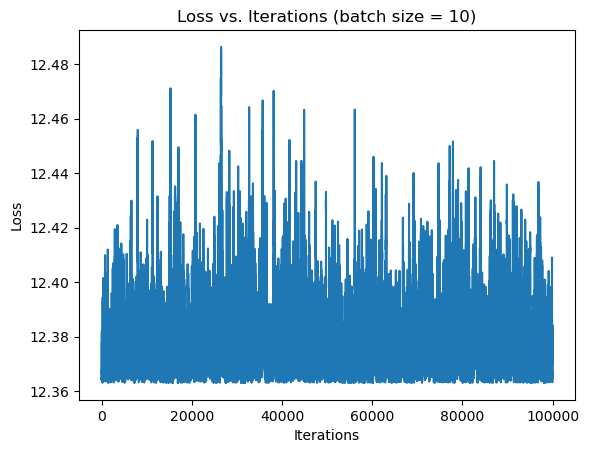

Batch size: 100, Time: 0.670860767364502 seconds


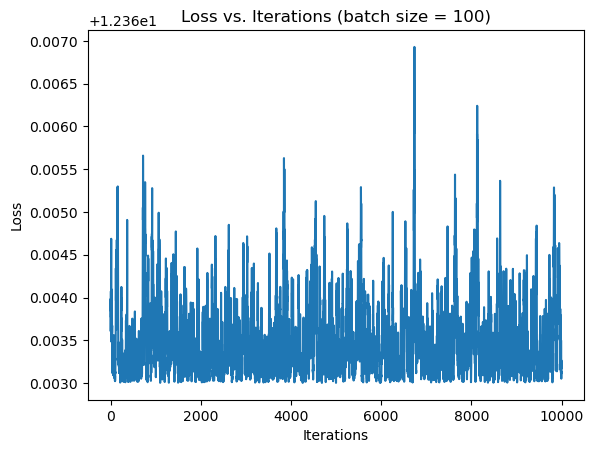

Batch size: 1000, Time: 0.20857906341552734 seconds


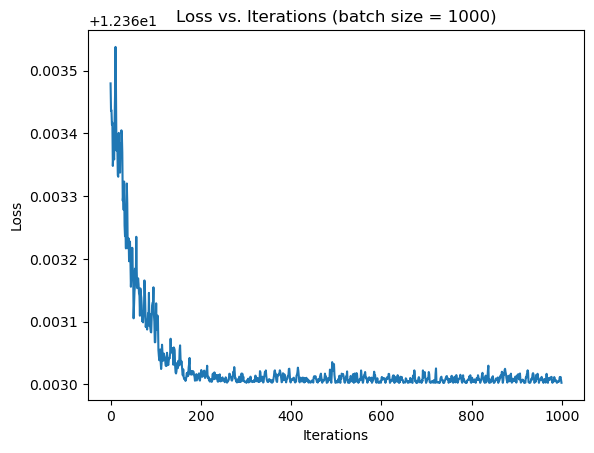

Batch size: 5000, Time: 0.09474825859069824 seconds


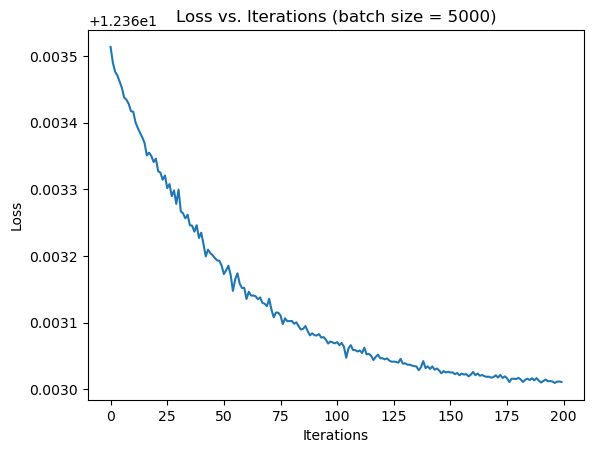

In [3]:
import time
import matplotlib.pyplot as plt

def SGD(x, y, theta, alpha, num_iters, batch_size):
    """
    Perform Stochastic Gradient Descent (SGD) with arbitrary batch size.

    Parameters:
    x : ndarray
        The input data points.
    y : ndarray
        The target values.
    theta : ndarray
        The initial coefficients.
    alpha : float
        The learning rate.
    num_iters : int
        The number of iterations.
    batch_size : int
        The size of the batch.

    Returns:
    theta : ndarray
        The final coefficients.
    loss_history : list
        The history of the loss function.
    """
    m = len(y)
    loss_history = []

    for i in range(num_iters):
        # shuffle the dataset
        indices = np.random.permutation(m)
        x = x[indices]
        y = y[indices]

        for j in range(0, m, batch_size):
            # get the current batch
            x_batch = x[j:j+batch_size]
            y_batch = y[j:j+batch_size]

            # calculate the gradient
            gradient = (1/batch_size) * x_batch.T @ (x_batch @ theta - y_batch)

            # update the coefficients
            theta = theta - alpha * gradient

            # calculate the loss
            loss = (1/m) * np.sum((x @ theta - y)**2)
            loss_history.append(loss)

    return theta, loss_history

# define the learning rate and the number of iterations

alpha = 0.01
num_iters = 100



batch_sizes = [10, 100, 1000, 5000]
# Running SGD for each batch size and plotting the Loss over iterations
for batch_size in batch_sizes:
    start_time = time.time()
    theta_sgd, loss_history = SGD(x, y, theta, alpha, num_iters, batch_size)
    end_time = time.time()
    print(f"Batch size: {batch_size}, Time: {end_time - start_time} seconds")

    plt.plot(loss_history)
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.title(f'Loss vs. Iterations (batch size = {batch_size})')
    plt.show()


# Conclusions
PART 2:
As the batchsize gets larger the time alloted to run the SGD decreases. I can speculate that this is because batchsize determines the number of training examples we are using to compute the gradient. As the batch size gets larger, more training examples are used in each interation. 
PART 3:
In terms of our specific SGD function we found that increasing the batchsize speeds up our computational time AND minimizes our loss function. By looking at the plots of Loss over Iterations for each batch size- for smaller batch sizes our loss compared to iterations does not really decrease. But as our batch size increases we get a better minimization of the loss function.

# Exercise 2: SGD animation for polynomial regression (30 pts)

In this exercise, our goal is to create a similar animation (which is available [here](https://nbviewer.org/github/PhilChodrow/PIC16B/blob/master/lectures/math/optimization.ipynb)) for polynomial regression model.  


#### Comments:
You cannot copy the code in the link directly because 

1. the sample code is for simple linear regression only, but we are considering polynomial regression.

2. the data generating process is included in the class initialization, however training data are provided in this exercise.

Please understand the sample code first, and then modify it accordingly. It is also fine if you do not write a class (class is used in the sample code) to do the animation.

200 interations are used in the sample code. Since our model is complicated here, you can use more iterations if you like.

#### Grading policy:
1. There is no error in your code.
2. The animation result looks reasonable.
3. Docstring and comments are required for your code.


#### Mathematics on polynomial regression:
Given data points $(x_i,y_i)_{i=1}^m$, polynomial regression is considered if we believe that the true relation between input $x$ and output $y$ can be described by a polynomial $y=a_0+a_1x+\cdots+a_nx^n$ for some degree $n$.

The goal is to find coefficients $a_0,\cdots,a_n$ by minimizing the loss function
$$ \mathop{\mathrm{minimize}}_{a_o,\cdots,a_n} \frac{1}{m}\sum_{i=1}^m (a_0+a_1x_i+\cdots+a_nx_i^n-y_i)^2 $$

Then we can use SGD to solve this optimization problem.

#### Data Generation

Please run the following code to generate the data points.

In [4]:
import numpy as np

# number of observations
m = 100
# generate input x 
X = np.random.uniform(0,3,m)
X.sort()
# generate output y
y = -2 - 2*X + X**2 + 0.1*np.random.randn(m)

In [5]:
class UpdatePlot:
    """
    an update class for a linear regression stochastic gradient descent (SGD)
    animation. Takes instance variables corresponding to plot objects, 
    parameters and estimates, and animation controls. Calling the class
    updates the plot. 
    
    X: the np.array of input data
    y: the np.array of output data
    ax: array of 2 axes on which to plot
    a0, a1, a2: floats, true parameters of linear regression
    a0_, a1_, a2_: floats, initial estimates of the true parameters
    eps: float, learning rate
    """
    
    def __init__(self, X, y,ax, a0, a1, a2, a0_, a1_, a2_, eps = 0.01):
        
        # store the axes on which to plot
        self.ax0 = ax[0]
        self.ax1 = ax[1]
        
        # true coefficients
        self.a0 = a0
        self.a1 = a1
        self.a2 = a2
        
        # initial coefficient estimates
        self.a0_ = a0_
        self.a1_ = a1_
        self.a2_ = a2_
        
        # store data
        self.X = X
        self.y = y
        
        # used for plotting lines
        self.x_space = np.linspace(0, X.max(), 100)

        # show data on lefthand plot
        self.ax0.scatter(self.X, self.y, color = "grey", s = 4, zorder = 100)
        
        # prepare animation variables
        self.point = self.ax0.scatter([], [], color = "red", zorder = 200)
        self.line, = self.ax0.plot([], [], 'k-')
        self.loss, = self.ax1.plot([], [], 'k-')
        
        # learning rate
        self.eps = eps
        
        # timesteps and value of loss function
        self.t = []
        self.L = []
        
    def __call__(self, i):
        """
        makes the class callable, resulting in plot updates
        each call performs a single step of SGD and returns
        appropriate artists. i represents the algorithm 
        timestep/animation frame. 
        """
        
        # pick a random point
        j = np.random.randint(len(self.X))      
        x, y = self.X[j], self.y[j]
        
        # update estimates with gradient of loss function evaluated 
        # at that point with respect to the coefficients
        # "this is the math"
        self.a0_ = self.a0_ - self.eps*(self.a0_ + self.a1_*x + self.a2_*x**2 - y)
        self.a1_ = self.a1_ - self.eps*(x*(self.a0_ + self.a1_*x + self.a2_*x**2 - y))
        self.a2_ = self.a2_ - self.eps*(x**2*(self.a0_ + self.a1_*x + self.a2_*x**2 - y))
        
        # evaluate loss function 
        L = np.mean((self.a0_ + self.a1_*self.X + self.a2_*self.X**2 - self.y)**2)
        
        # update lefthand plot with highlight point and new regression line
        self.point.set_offsets(np.c_[x, y])
        self.line.set_data(self.x_space, self.a0_ + self.a1_*self.x_space + self.a2_*self.x_space**2)
        
        # update timestep and loss function
        self.t.append(i)
        self.L.append(L)
        
        # update righthand plot with loss function
        self.loss.set_data(self.t, self.L)

        # return artists
        return [self.point, self.line, self.loss]
    
# number of algorithm iterations
n_steps = 500

# create plotting background
fig, ax = plt.subplots(1, 2, figsize = (7, 3))

ax[0].set_xlim(0, X.max())
ax[0].set_ylim(y.min(), y.max())

ax[1].set_xlim(0, n_steps)
ax[1].set_ylim(0, 5)
ax[1].grid(True)

ax[0].set(title = "Regression Problem", 
          xlabel = r"$x$",
          ylabel = r"$y$")

ax[1].set(title = "Current Loss",
          xlabel = "Iteration",
          ylabel = r"$\mathcal{L}$")

plt.tight_layout()

# create the animation
update = UpdatePlot(X, y, ax, -2, -2, 1, 0, 0, 0, eps = 0.01)
anim = FuncAnimation.FuncAnimation(fig, update, frames = n_steps, blit = True)

# display the animation
plt.close()
HTML(anim.to_jshtml())

https://github.com/ericchiedu/HW